# Общепит Москвы

## Задача

Подготовить данные для презентации инвесторам об устройстве рынка общепита Москвы на основе открытых данных.

Что просят посчитать:

- Соотношение видов объектов общественного питания по количеству.
- Соотношение сетевых и несетевых заведений по количеству.
- Для какого вида объекта общественного питания характерно сетевое распространение?
- Что характерно для сетевых заведений: много заведений с небольшим числом посадочных мест в каждом или мало заведений с большим количеством посадочных мест?
- Для каждого вида объекта общественного питания опишите среднее количество посадочных мест. Какой вид предоставляет в среднем самое большое количество посадочных мест?
- Топ-10 улиц по количеству объектов общественного питания. Воспользуйтесь внешней информацией и ответьте на вопрос — в каких районах Москвы находятся эти улицы?
- Найдите число улиц с одним объектом общественного питания. Воспользуйтесь внешней информацией и ответьте на вопрос — в каких районах Москвы находятся эти улицы?
- Посмотрите на распределение количества посадочных мест для улиц с большим количеством объектов общественного питания. Какие закономерности можно выявить?

## Описание данных


- `id` — идентификатор объекта;
- `object_name` — название объекта общественного питания;
- `chain` — сетевой ресторан;
- `object_type` — тип объекта общественного питания;
- `address` — адрес;
- `number` — количество посадочных мест.

Источник данных и способ их сбора неизвестны, так что, увы, заранее не можем сделать никаких предположений о качестве данных: полноте и точности.

Исходные данные очень ограниченные – есть только адрес, тип заведения, принадлежность к сети и количество посадочных мест. Много тут не наисследуешь, но попробуем извлечь максимум из того, что есть.

Обогатим наш сет геоданными – по адресу добавим координаты, район, расстояние от метро.

In [1]:
!pip install contextily
!pip install geopandas

     |████████████████████████████████| 118 kB 1.3 MB/s eta 0:00:01
     |████████████████████████████████| 19.2 MB 5.9 MB/s eta 0:00:01
     |████████████████████████████████| 1.0 MB 1.3 MB/s eta 0:00:01
     |████████████████████████████████| 16.6 MB 57.4 MB/s eta 0:00:01
     |████████████████████████████████| 2.0 MB 66.0 MB/s eta 0:00:01
     |████████████████████████████████| 5.8 MB 61.2 MB/s eta 0:00:01


In [2]:
import contextily as ctx
import geopandas as gpd
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import seaborn as sns
import warnings

from io import BytesIO
from matplotlib.ticker import StrMethodFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pathlib import Path
from scipy import stats
from shapely.geometry import Polygon, Point
from shapely import wkt

In [3]:
# зададим дефолтные настройки отображения таблиц и графиков
pd.set_option('display.float_format', '{:_.2f}'.format)
#pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 30)
pd.set_option('display.min_rows', 30)
plt.rcParams['font.size'] = '12'
plt.rcParams['figure.figsize'] = (12, 6)
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

In [4]:
# пути до данных
if Path("/datasets").exists():
    REST = '/datasets/rest_data.csv'
else:
    REST = 'rest_data.csv'

## Загрузка и очистка данных

In [5]:
df = pd.read_csv(REST)
df.head()

,id,object_name,chain,object_type,address,number
0,151635,СМЕТАНА,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48
1,77874,Родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35
2,24309,Кафе «Академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95
3,21894,ПИЦЦЕТОРИЯ,да,кафе,"город Москва, Абрамцевская улица, дом 1",40
4,119365,Кафе «Вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50


In [6]:
# проверим, нет ли полных дублей
df.duplicated().sum()

0

In [7]:
# проверим, нет ли строк с дублирующимися id
df.duplicated(subset='id').sum()

0

In [8]:
# чуть-чуть поправим названия колонок
df.columns = ['id', 'name', 'is_chain', 'type', 'address', 'size']

In [9]:
# заменим "нет" и "да" в колонке is_chain на False и True
df.is_chain.replace({'нет': False, 'да': True}, inplace=True)

In [10]:
df.is_chain.value_counts()

False    12398
True      2968
Name: is_chain, dtype: int64

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15366 entries, 0 to 15365
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        15366 non-null  int64 
 1   name      15366 non-null  object
 2   is_chain  15366 non-null  bool  
 3   type      15366 non-null  object
 4   address   15366 non-null  object
 5   size      15366 non-null  int64 
dtypes: bool(1), int64(2), object(3)
memory usage: 615.4+ KB


Пропусков и дублей в данных нет. Это хорошо.

Теперь проверим, всё ли хорошо с названиями и типом заведений, немного исследуем размер заведений.

Поглядим, бывает ли так, что организации с одинаковыми названиями попадают в разные типы заведений.

Но сначала приведём названия к нормальному виду – уберём лишние пробелы, приведём к нижнему регистру, убьём знаки.

In [12]:
# сделаем функцию для нормализации названий
def normalize(name):
    norm_name = [char if char.isalnum() else ' ' for char in name.lower()] # убьём все кроме букв и цифр
    norm_name = ''.join(norm_name)
    norm_name = ' '.join(norm_name.split()).strip()                  # уберём двойные и лишние пробелы
    return norm_name

In [13]:
df['norm_name'] = df.name.apply(normalize)
df.sample(15, random_state=1)[['name', 'norm_name']]

,name,norm_name
2973,Луна,луна
2593,Столовая ГБОУ 45 Гимназия имени Л.И. Мильграмма,столовая гбоу 45 гимназия имени л и мильграмма
6737,Столовая ГБОУ СОШ № 1900,столовая гбоу сош 1900
14940,Holy Vegan,holy vegan
4088,Ресторан «Очаг гурманов»,ресторан очаг гурманов
5910,школа 775,школа 775
10541,24 Градуса,24 градуса
14563,Чайхана ОШ,чайхана ош
10497,ABC Coffee Roasters,abc coffee roasters
7708,Кафе Иль Патио «Il Patio»,кафе иль патио il patio


In [14]:
# посмотрим, бывает ли так, что одноименные организации попадают в разные типы организаций
(df
 .pivot_table(index='norm_name',
              aggfunc={'type': [lambda x: x.unique(), 'nunique'],
                       'is_chain': 'nunique',
                       'id': 'count'})
 .sort_values(by=[('type', 'nunique'), ('id', 'count')], ascending=False)
 .head(25)
)

id is_chain  \
                 count  nunique   
norm_name                         
кафе               278        1   
пекарня             82        1   
милти               72        1   
выпечка             36        1   
шаурма             250        1   
бургер кинг        137        1   
теремок             94        1   
крошка картошка     91        2   
буфет               82        1   
суши wok            72        1   
папа джонс          51        1   
бистро              25        1   
пицца паоло         18        2   
суши сет            16        2   
пекарня хлебница     7        1   
сушиstore            7        1   
столовая           321        1   
шоколадница        158        2   
домино с пицца      90        1   
додо пицца          49        1   
донер кебаб         48        1   
кофе с собой        46        1   
кафетерий           40        1   
subway              34        1   
starbucks           30        1   

                                                               type          
                                                         <lambda_0> nunique  
norm_name                                                                    
кафе              [кафе, столовая, кафетерий, предприятие быстро...       7  
пекарня           [предприятие быстрого обслуживания, столовая, ...       7  
милти             [магазин (отдел кулинарии), кафетерий, рестора...       7  
выпечка           [кафетерий, предприятие быстрого обслуживания,...       6  
шаурма            [предприятие быстрого обслуживания, закусочная...       5  
бургер кинг       [предприятие быстрого обслуживания, ресторан, ...       5  
теремок           [кафе, предприятие быстрого обслуживания, заку...       5  
крошка картошка   [предприятие быстрого обслуживания, ресторан, ...       5  
буфет             [буфет, бар, предприятие быстрого обслуживания...       5  
суши wok          [предприятие быстрого обслуживания, кафе, мага...       5  
папа джонс        [кафе, ресторан, предприятие быстрого обслужив...       5  
бистро            [предприятие быстрого обслуживания, кафе, кафе...       5  
пицца паоло       [магазин (отдел кулинарии), предприятие быстро...       5  
суши сет          [закусочная, магазин (отдел кулинарии), предпр...       5  
пекарня хлебница  [магазин (отдел кулинарии), предприятие быстро...       5  
сушиstore         [бар, закусочная, предприятие быстрого обслужи...       5  
столовая                          [столовая, кафе, буфет, ресторан]       4  
шоколадница       [кафе, ресторан, бар, предприятие быстрого обс...       4  
домино с пицца    [кафе, ресторан, предприятие быстрого обслужив...       4  
додо пицца        [ресторан, предприятие быстрого обслуживания, ...       4  
донер кебаб       [предприятие быстрого обслуживания, бар, закус...       4  
кофе с собой      [предприятие быстрого обслуживания, кафетерий,...       4  
кафетерий         [кафетерий, кафе, столовая, предприятие быстро...       4  
subway            [кафе, предприятие быстрого обслуживания, рест...       4  
starbucks         [кафе, предприятие быстрого обслуживания, рест...       4

Да – бывает. И речь не только о генерических названиях вроде "кафе" или "шаурма". Например, "крошка картошка", "пицца паоло", "шоколадница" – попадают не только в разные типы общепита, но и даже одновременно в сетевые и несетевые точки.

Вообще говоря, это большая проблема. Только на тех данных, что у нас есть, придумать какое-то правило для однозначного выставления правильного типа, не получится.

Теоретически могут быть организации с одинаковыми названиями, которые входят в сеть, и которые являются самостоятельными заведениями. А могут быть и организации с немного разными названиями, но входящие в одну сеть (что-нибудь вроде, "Кафе сеть. Покровка", "Кафе сеть. Солянка").

Мы даже не очень понимаем, что именно в наших данных подразумевается под сетевой организацией. Точки, принадлежащие одной компании? Точки под одним брендом? 

С типом заведения тоже не вполне ясно. Чем "кафе" отличается от "кафетерия" и "буфета", а "предприятие быстрого питания" от "закусочной"?

Если бы у нас было реальное исследование, нам надо было бы выяснить, как собирались эти данные, уточнить правила присвоения типов. Может быть, получить данные из других источников, совместить их, чтобы уточнить вопросы.

Но в рамках учебного проекта оставим всё как есть. Разве что можно немного сократить количество типов заведения. Постараемся объединить похожие.

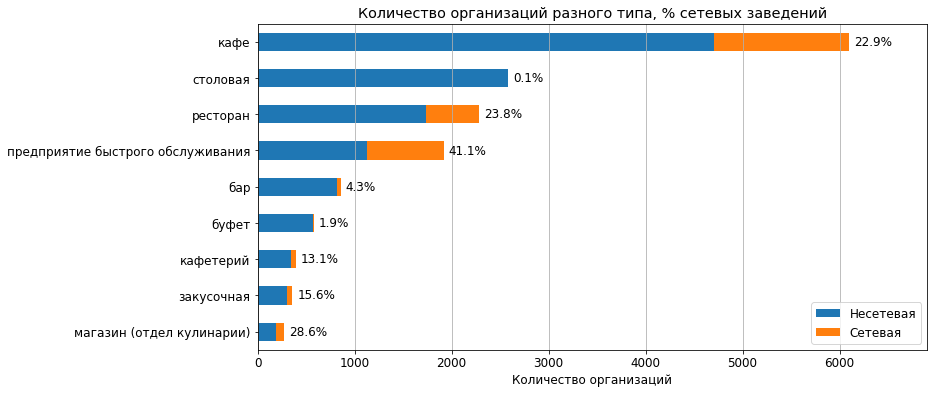

In [15]:
# посмотрим, сколько у нас организаций разного типа
# этот график мы будем рисовать ещё пару раз, так что обернём его в функцию

def show_type_plot(df):
    fig, ax = plt.subplots()
    _df = (df
           .pivot_table(index='type',
                        columns='is_chain',
                        aggfunc={'name': 'count'})
           .droplevel(0, axis=1)
           .rename({False: 'not_chain', True: 'chain'}, axis=1)
          )

    _df['total'] = _df.not_chain + _df.chain
    _df['chain_share'] = _df.chain / _df.total
    _df.sort_values(by='total', inplace=True)

    _df[['not_chain', 'chain']].plot(kind='barh', stacked=True, ax=ax)

    ax.set_title('Количество организаций разного типа, % сетевых заведений')
    ax.set_ylabel('')
    ax.set_xlabel('Количество организаций')
    ax.grid(axis='x')
    ax.legend(['Несетевая', 'Сетевая'])

    xmax = plt.xlim()[1]
    plt.xlim(0, xmax+500)

    sum_share = _df[['total', 'chain_share']].to_records(index=False)
    for i, line in enumerate(sum_share):
        ax.text(line[0] + 50,
                i,
                f'{line[1]:.1%}',
                color='black', fontsize=12, ha='left', va='center')

    plt.show()

show_type_plot(df)

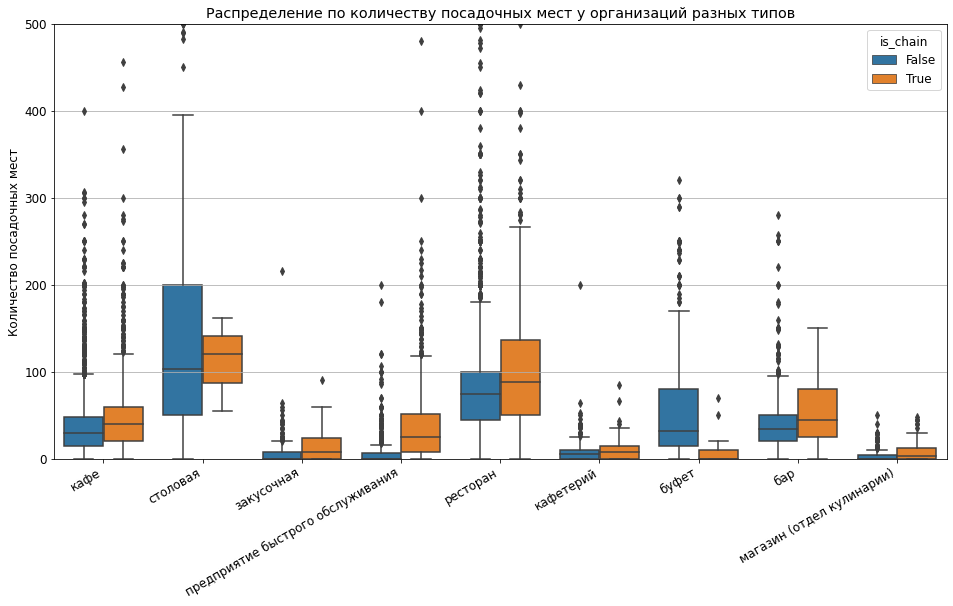

In [16]:
# посмотрим на количество посадочных мест у организаций разного типа
# график тоже обернём в функцию

def show_type_box(df):
    fig, ax = plt.subplots(figsize=(16, 8))
    sns.boxplot(x="type", y="size", hue="is_chain", data=df, ax=ax)
    ax.set_title('Распределение по количеству посадочных мест у организаций разных типов')
    ax.set_ylim(0, 500)
    ax.set_xlabel('')
    ax.set_ylabel('Количество посадочных мест')
    ax.grid(axis='y')
    plt.xticks(rotation=30, ha='right')
    plt.show()

show_type_box(df)

In [17]:
# и то же самое таблицей
(df
 .pivot_table(index='type',
              columns='is_chain',
              aggfunc={'id': 'count',
                       'size': ['min', 'max', 'median'],
                       'norm_name': lambda x: list(x.value_counts().head(3).index)
                      }
             )
)

id        \
                                  count         
is_chain                          False True    
type                                            
бар                                 819    37   
буфет                               574    11   
закусочная                          304    56   
кафе                               4703  1396   
кафетерий                           346    52   
магазин (отдел кулинарии)           195    78   
предприятие быстрого обслуживания  1132   791   
ресторан                           1741   544   
столовая                           2584     3   

                                                                           norm_name  \
                                                                            <lambda>   
is_chain                                                                       False   
type                                                                                   
бар                                                     [бар, лобби бар, пивной бар]   
буфет                                       [буфет, кп мэи, столовая при школе 2107]   
закусочная                                             [шаурма, закусочная, пекарня]   
кафе                                                       [кафе, кофейня, пиццерия]   
кафетерий                                              [кафетерий, кофейня, пекарня]   
магазин (отдел кулинарии)                              [пекарня, кулинария, выпечка]   
предприятие быстрого обслуживания                     [шаурма, донер кебаб, пекарня]   
ресторан                                                    [ресторан, шикари, кафе]   
столовая                           [столовая, школьно базовая столовая, столовая ...   

                                                                                      \
                                                                                       
is_chain                                                                       True    
type                                                                                   
бар                                             [мята lounge, кружка, золотая вобла]   
буфет                                                 [кофе с собой, теремок, милти]   
закусочная                                             [теремок, милти, бургер кинг]   
кафе                                       [шоколадница, домино с пицца, додо пицца]   
кафетерий                                         [кофе с собой, cofix, пицца паоло]   
магазин (отдел кулинарии)          [милти, суши wok, кулинарная лавка братьев кар...   
предприятие быстрого обслуживания                     [макдоналдс, kfc, бургер кинг]   
ресторан                                                    [чайхона 1, kfc, тануки]   
столовая                                                     [грабли, му му, гурман]   

                                      size                                   
                                       max        median          min        
is_chain                             False  True   False  True  False True   
type                                                                         
бар                               1_700.00 150.00  34.00  45.00  0.00  0.00  
буфет                               320.00  70.00  32.00   0.00  0.00  0.00  
закусочная                          216.00  91.00   0.00   8.00  0.00  0.00  
кафе                                533.00 456.00  30.00  40.00  0.00  0.00  
кафетерий                           200.00  85.00   6.00   8.00  0.00  0.00  
магазин (отдел кулинарии)            50.00  48.00   0.00   3.50  0.00  0.00  
предприятие быстрого обслуживания   200.00 580.00   0.00  25.00  0.00  0.00  
ресторан                          1_500.00 500.00  75.00  88.50  0.00  0.00  
столовая                          1_400.00 162.00 103.00 120.00  0.00 55.00

Опишем, что мы видим:

- есть 4-5 основных типов заведений: кафе, столовая, ресторан, фастфуд, бар.
- сетевые заведения актуальны только для кафе, ресторанов и фастфуда. в других типах доля сетевых точек очень маленькая. а сетевых столовых почти что не бывает.
- некоторые крупные сети, например, kfc, бургер кинг, милти, суши wok попадают в топы разных типов организаций по количеству точек.

In [18]:
# еще раз посмотрим, на некоторые крупные организации, которые попали в разные типы.
# мак, kfc и бургер кинг это и фастфуд, и ресторан, и кафе

for name in ['kfc', 'макдоналдс', 'бургер кинг', 'шаурма', 'му му', 'суши wok']:
    print('   ',  name)
    display(df.query('norm_name.str.contains(@name)').type.value_counts())
    print()

    kfc


предприятие быстрого обслуживания    123
ресторан                              35
кафе                                  31
закусочная                             1
Name: type, dtype: int64


    макдоналдс


предприятие быстрого обслуживания    117
ресторан                              31
кафе                                  25
Name: type, dtype: int64


    бургер кинг


предприятие быстрого обслуживания    112
кафе                                  26
ресторан                              17
закусочная                             5
бар                                    1
Name: type, dtype: int64


    шаурма


предприятие быстрого обслуживания    230
закусочная                            89
кафе                                  29
магазин (отдел кулинарии)             14
буфет                                  6
кафетерий                              2
Name: type, dtype: int64


    му му


кафе                                 28
предприятие быстрого обслуживания     4
ресторан                              1
столовая                              1
Name: type, dtype: int64


    суши wok


кафе                                 35
предприятие быстрого обслуживания    24
магазин (отдел кулинарии)            10
закусочная                            4
бар                                   3
Name: type, dtype: int64

Как уже сказали выше, поправить проблемы с тем, что точки одной и той же сети скорее всего могут попадать в разные типы заведений, мы не можем. Можно только подсократить количество типов заведений. Так и анализировать будет проще, и часть проблем уйдёт.

In [19]:
# объединим и переименуем типы организаций

rename = {'кафетерий': 'кафе',
         'буфет': 'фастфуд',
         'закусочная': 'фастфуд',
         'магазин (отдел кулинарии)': 'фастфуд',
         'предприятие быстрого обслуживания': 'фастфуд'}

df.type.replace(rename, inplace=True)

df.type.value_counts()

кафе        6497
фастфуд     3141
столовая    2587
ресторан    2285
бар          856
Name: type, dtype: int64

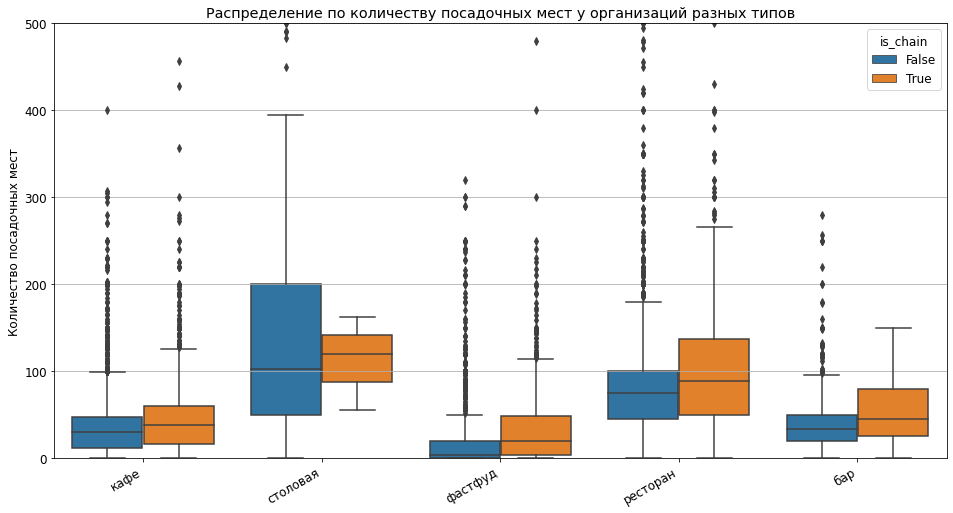

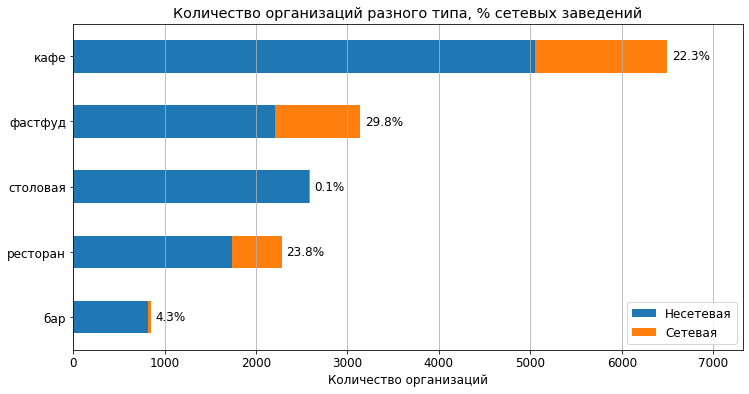

In [20]:
# посмотрим, на наши графики после объединения

show_type_box(df)
show_type_plot(df)

In [21]:
# у нас есть сколько-то очень больших заведений. 
# посмотрим, что это такое

df[df['size'] > 1000].sort_values(by='size', ascending=False)

,id,name,is_chain,type,address,size,norm_name
12723,199696,Arena by Soho Family,False,бар,"город Москва, Кутузовский проспект, дом 36, ст...",1700,arena by soho family
8148,80291,Банкетный зал Шелк,False,ресторан,"город Москва, Большой Саввинский переулок, дом...",1500,банкетный зал шелк
8345,27750,СТОЛОВАЯ-БУФЕТ,False,столовая,"город Москва, улица Волхонка, дом 15",1400,столовая буфет
9064,19719,КОМБИНАТ ПИТАНИЯ «УПРАВЛЕНИЕ АКАДЕМСЕРВИС»,False,столовая,"город Москва, проспект Вернадского, дом 84, ст...",1288,комбинат питания управление академсервис
3686,27026,РУМ СЕРВИС,False,ресторан,"город Москва, площадь Европы, дом 2",1200,рум сервис
4480,27024,РУМ СЕРВИС,False,ресторан,"город Москва, Кутузовский проспект, дом 2/1, с...",1200,рум сервис
2313,26560,Ресторан «АЛЬФА»,False,ресторан,"город Москва, Измайловское шоссе, дом 71, корп...",1040,ресторан альфа


Эти огромные заведения, видимо, действительно существуют: бар в большом клубе, столовая Храма Христа Спасителя и в большом учебном заведении, рум-сервис в больших гостиницах, оформленный как ресторан. Судя по всему это не ошибки, но и обычными эти заведения не назовешь. Это скорее уникальные случаи.

По-хорошему, следовало бы руками почитстить верхушку, чтобы убрать часть выбросов. Но мы оставим как есть, и, где возможно, будем ориентироваться на медиану, а не на среднее, чтобы эти выбросы не портили нам картину.

Чтобы лучше представлять себе устройство данных, ещё посмотрим на распределения.

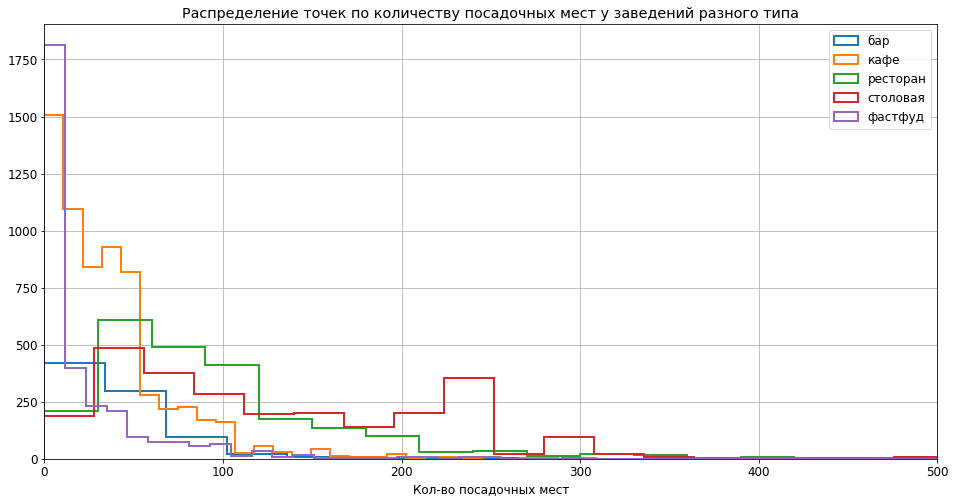

In [22]:
# построим распределение по размеру для разных типов на одном графике

fig, ax = plt.subplots(figsize=(16, 8))
df.groupby('type')['size'].hist(histtype='step', legend=True, bins=50, ax=ax, linewidth=2)
ax.set_title('Распределение точек по количеству посадочных мест у заведений разного типа')
ax.set_xlabel('Кол-во посадочных мест')
ax.set_xlim(0, 500)
plt.show()

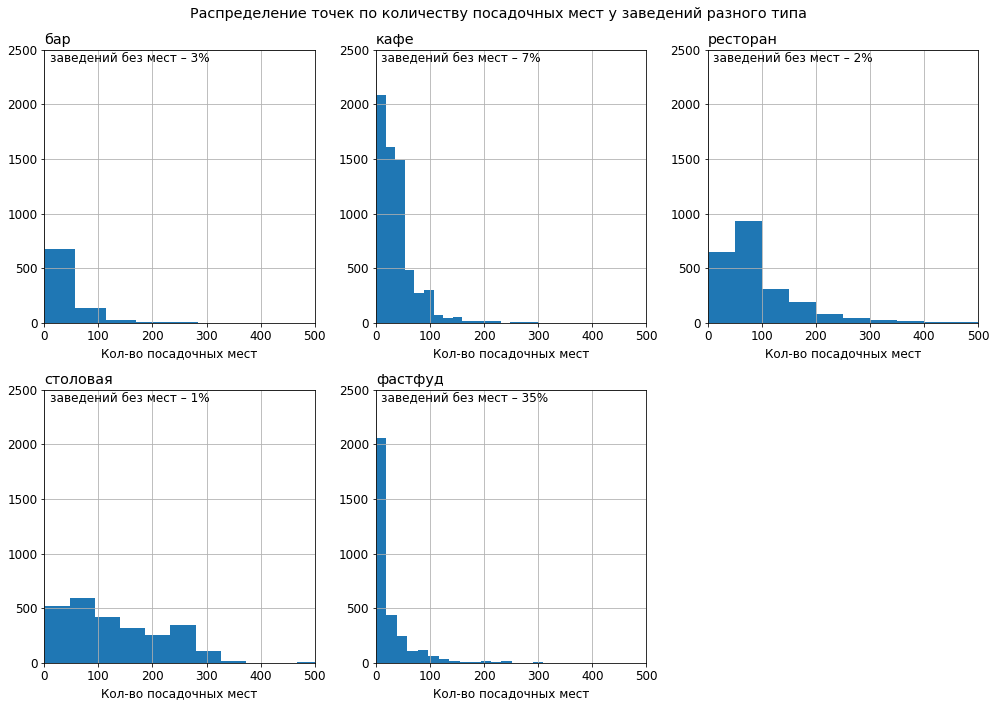

In [23]:
# и чтобы было понятнее – на разных картинках, но на одной оси

def show_type_size_hist(df):
    fig, axes = plt.subplots(2, 3, figsize=(14, 10))
    for data, ax in zip(df.groupby('type')['size'], axes.flat):
        data[1].hist(ax=ax, bins=30)
        zero_share = ((data[1] == 0).sum() / len(data[1]))
        ax.text(10, 2400,
                f'заведений без мест – {zero_share:.0%}',
                color='black', fontsize=12, ha='left')
        ax.set_ylim(0, 2500)
        ax.set_xlim(0, 500)
        ax.set_title(data[0], loc='left')
        ax.set_xlabel('Кол-во посадочных мест')
    #     data.hist(histtype='step', legend=True, bins=50, ax=ax, linewidth=2)
    # ax.set_xlim(0, 500)
    fig.delaxes(axes.flat[-1])
    plt.suptitle('Распределение точек по количеству посадочных мест у заведений разного типа')
    plt.tight_layout()
    plt.show()

show_type_size_hist(df)

Ну что ж – выглядит всё достаточно правдоподобно. Бары, кафе и фастфуд в основном маленькие, причем у фастфуда больше трети точек вообще не имеют посадочных мест. Рестораны обычно побольше. И самые большие – столовые.

### Геокодирование адресов

Для визуализации и обогащения данных проведем обратное геокодирование наших адресов – по адресу получим координату и некоторые дополнительные данные, например, район, расстояние до метро и т.п. 

Для простоты воспользовались платным сервисом [Dadata](https://dadata.ru/). Сделали это один раз для уникальных адресов. Все полученные данные выгрузили в табличку. Для проекта будем грузить её из гугл-таблицы. В ячейке ниже – закомментированный код выгрузки данных из Dadata.

In [24]:
# from dadata import Dadata

# token = "zzz"
# secret = "xxx"

# token = "ec15b6a24ef7937395ad4d0ca13e9547ddb35dda"
# secret = "b535d304b5963a58423e6a73cb0a55b7a2e74212"
# dadata = Dadata(token, secret)

# # функции для вызова API стандартизации

# def make_dict(response, params):
#     result = {}
#     for param in params:
#         try:
#             if not param == 'metro':
#                 result[param] = response[param]
#             else:
#                 try:
#                     result['metro_name'] = response[param][0]['name']
#                     result['metro_dist'] = response[param][0]['distance']
#                 except:
#                     pass
#         except:
#             pass
        
#     return result

# def get_info(addr_list, params):
#     result = {}
#     for address in addr_list:
#         try:
#             response = dadata.clean(name="address", source=address)
#         except:
#             response = False
#             pass
    
#         if response:
#             result[address] = make_dict(response, params) 
#     return result


In [25]:
# # список параметров, которые будем брать из данных геокодера
# params = [
#      'result',
#      'region_with_type',
#      'city',
#      'city_area',
#      'city_district_with_type',
#      'city_district',
#      'street_with_type',
#      'street_type_full',
#      'street',
#      'geo_lat',
#      'geo_lon',
#      'beltway_hit',
#      'beltway_distance',
#      'qc_geo',
#      'qc',
#      'unparsed_parts',
#      'metro'
# ]

In [26]:
# # соберём список уникальных адресов, прогоним его через геокодер и выгрузим в файлик.

# address = list(df.address.unique())
# geocoded_address = get_info(address, params)

# geo_df = pd.DataFrame.from_dict(geocoded_address, orient='index').reset_index()
# geo_df.to_csv('geo_df.tsv', sep='\t')

In [27]:
# загрузим геокодированные данные

spreadsheet_id = '1HEEUyApvVcXErZebv-8eEfq_HxNGOxXnKbhuvgudP9s'
file_name = f'https://docs.google.com/spreadsheets/d/{spreadsheet_id}/export?format=csv'
r = requests.get(file_name)
geo_df = pd.read_csv(BytesIO(r.content))
geo_df.head()

,index,result,region_with_type,city,city_area,city_district_with_type,city_district,street_with_type,street_type_full,street,geo_lat,geo_lon,beltway_hit,beltway_distance,qc_geo,qc,unparsed_parts,metro_name,metro_dist
0,"город Москва, улица Егора Абакумова, дом 9","г Москва, ул Егора Абакумова, д 9",г Москва,NaN,Северо-восточный,р-н Ярославский,Ярославский,ул Егора Абакумова,улица,Егора Абакумова,55.88,37.71,IN_MKAD,NaN,0,0,NaN,Бабушкинская,3.30
1,"город Москва, улица Талалихина, дом 2/1, корпус 1","г Москва, ул Талалихина, д 2/1 к 1",г Москва,NaN,Центральный,р-н Таганский,Таганский,ул Талалихина,улица,Талалихина,55.74,37.67,IN_MKAD,NaN,0,3,NaN,Крестьянская застава,0.80
2,"город Москва, Абельмановская улица, дом 6","г Москва, ул Абельмановская, д 6",г Москва,NaN,Центральный,р-н Таганский,Таганский,ул Абельмановская,улица,Абельмановская,55.74,37.67,IN_MKAD,NaN,0,0,NaN,Крестьянская застава,0.40
3,"город Москва, Абрамцевская улица, дом 1","г Москва, ул Абрамцевская, д 1",г Москва,NaN,Северо-восточный,р-н Лианозово,Лианозово,ул Абрамцевская,улица,Абрамцевская,55.89,37.57,IN_MKAD,NaN,0,0,NaN,Алтуфьево,1.10
4,"город Москва, Абрамцевская улица, дом 9, корпус 1","г Москва, ул Абрамцевская, д 9 к 1",г Москва,NaN,Северо-восточный,р-н Лианозово,Лианозово,ул Абрамцевская,улица,Абрамцевская,55.90,37.57,IN_MKAD,NaN,0,0,NaN,Алтуфьево,1.10


In [28]:
# из координат сделаем геометрические точки

def make_point(row):
    if row.geo_lon and row.geo_lat:
        return Point(float(row.geo_lon), float(row.geo_lat))
    return None

geo_df['geometry'] = geo_df[['geo_lon', 'geo_lat']].apply(make_point, axis=1)

/opt/conda/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:112: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  values = construct_1d_object_array_from_listlike(values)


In [29]:
# добавим наши геоданные в основной сет.
# и превратим его в датафрейм геопандас – так сможем быстро отрисовывать данные на карте.

df = df.merge(geo_df, how='left', left_on='address', right_on='index')
df = gpd.GeoDataFrame(df).set_crs("EPSG:4326").to_crs(epsg=3857)

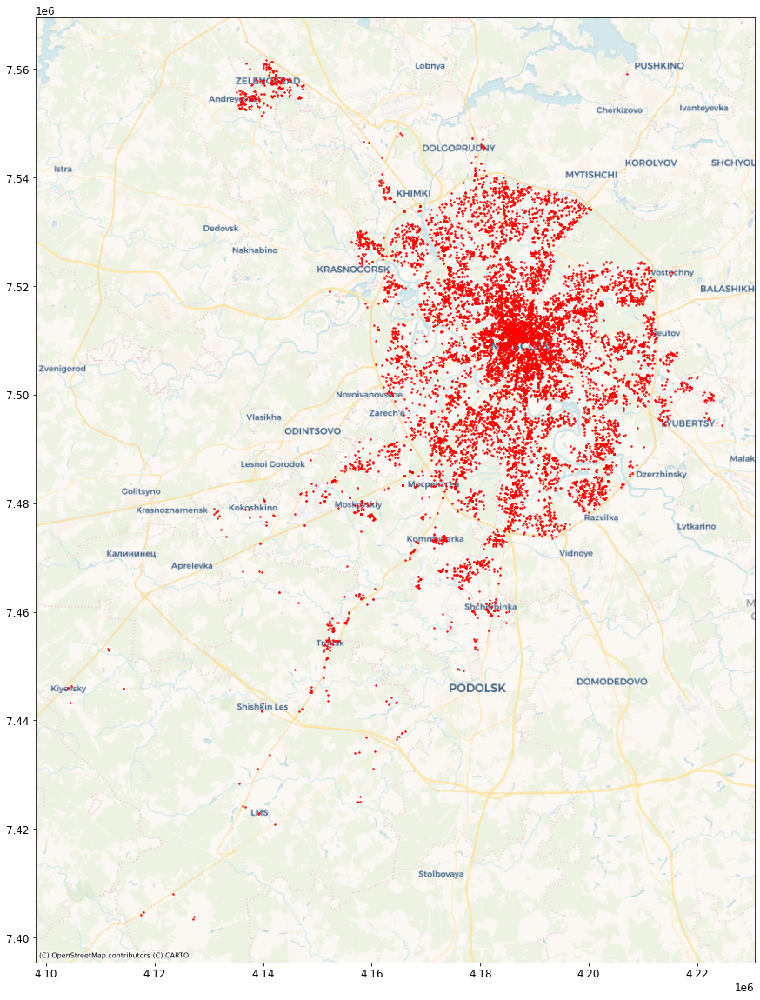

In [30]:
# посмотрим, как наши точки распределились по карте
fig, ax = plt.subplots(figsize=(16, 20))
df.plot(ax=ax, markersize=2, color='red')
ctx.add_basemap(ax, crs=df.crs, source=ctx.providers.CartoDB.Voyager)
plt.show()

In [31]:
# проверяем, что нет точек без координат
display(df.geometry.isna().sum())

# проверяем, что всё определилилось в Москву
df.region_with_type.value_counts()

0

г Москва    15366
Name: region_with_type, dtype: int64

IN_MKAD     13764
OUT_MKAD     1561
Name: beltway_hit, dtype: int64

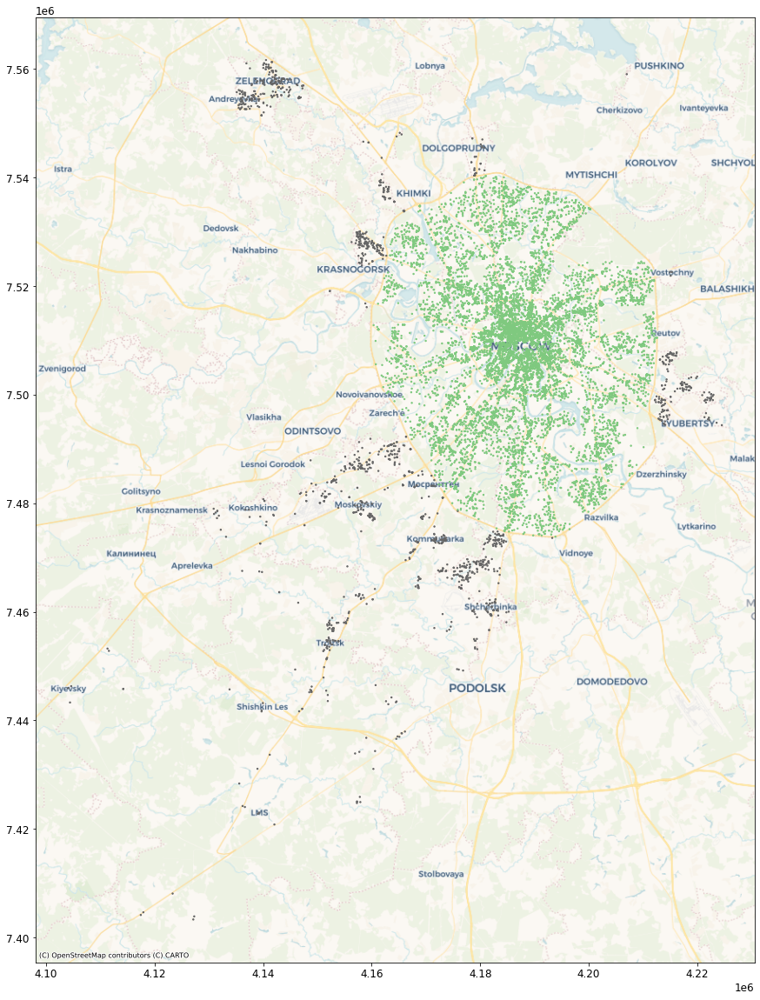

In [32]:
# посмотрим, что параметр beltway_hit - внутри или за МКАД - выставился правильно
display(df.beltway_hit.value_counts())

fig, ax = plt.subplots(figsize=(16, 20))
df.plot('beltway_hit', ax=ax, markersize=2, cmap='Accent')
ctx.add_basemap(ax, crs=df.crs, source=ctx.providers.CartoDB.Voyager)
plt.show()

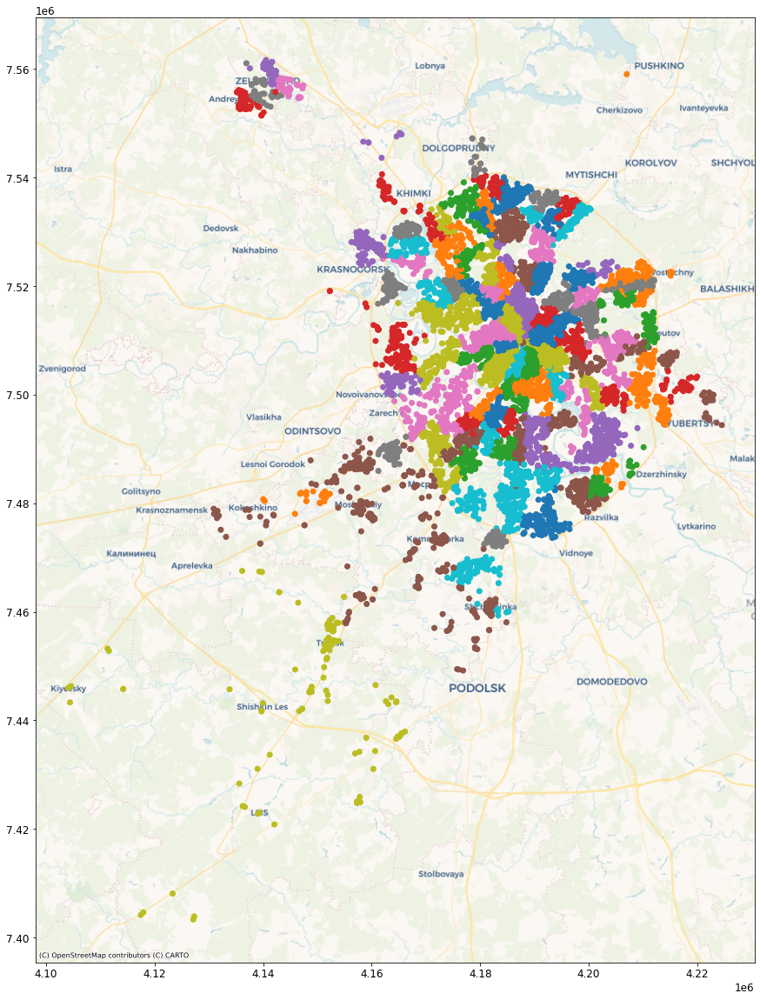

In [33]:
# посмотрим, что параметр city_district выставился правдоподобно
fig, ax = plt.subplots(figsize=(16, 20))
df.plot('city_district', ax=ax)
ctx.add_basemap(ax, crs=df.crs, source=ctx.providers.CartoDB.Voyager)
plt.show()

Видим, что всё в основном ок:
- у всех точек есть координаты
- все точки попали в административную Москву
- судя по тому, что карта с районами напоминает реальное администртивное деление, координаты по адресам определились тоже более-менее верно.
- попадание в пределы МКАД выставлено верно
- районы в старой Москве выставились скорее всего правильно
- в Новой Москве, кажется, есть косяк – она все поделилась на два района – это потому что вместо района в поле city_district для Новой Москвы проставился округ (Новомосковский или Троицкий).

В целом, кажется, что точки за МКАД в нашем анализе использовать не стоит. Хотя административно эти районы и считаются Москвой, во многих из них жизнь с точки зрения общепита может быть устроена сильно иначе – меньше трафик, арендные ставки, другой тип доступных площадей.

За пределами кольцевой – около 10% наших данных – можем пожертвовать ими ради чистоты. И проблему с неправильным определением районов в Новой Москве заодно решать не надо ))

Выделим данные в пределах МКАД в отдельный датасет. Дальше будем работать только с ним.

In [34]:
mos_df = df.query('beltway_hit == "IN_MKAD"').copy()

In [35]:
# приведём названия районов к нижнему регистру
mos_df.city_district = mos_df.city_district.str.lower()

### Районы

Для визуализации по районам подготовим сет с данными и графику. Шейп-файлы взяли из интернета. Немного почистили – убрали районы за мкадом, привели к нижнему регистру и избавились от Ё. Сразу загрузим подготовленную таблицу.

In [38]:
# загрузим подготовленную таблицу с районами

spreadsheet_id = '1071Gq9WQ5mxrnTWhFMFvMUyAh7YTjmU0F0L2d-NZiSI'
file_name = f'https://docs.google.com/spreadsheets/d/{spreadsheet_id}/export?format=csv'
r = requests.get(file_name)
districts = pd.read_csv(BytesIO(r.content))
districts.geometry = districts.geometry.apply(wkt.loads)
districts = gpd.GeoDataFrame(districts).set_crs("EPSG:3857")

,name,name_ao,type_mo,geometry
0,филевский парк,Западный,Муниципальный округ,"POLYGON ((4166426.928 7508453.650, 4166520.036..."
1,щукино,Северо-Западный,Муниципальный округ,"POLYGON ((4168481.029 7517613.545, 4168489.167..."
2,нагатинский затон,Южный,Муниципальный округ,"POLYGON ((4191560.075 7490117.199, 4191560.999..."
3,дмитровский,Северный,Муниципальный округ,"POLYGON ((4174063.924 7537041.073, 4174315.172..."
4,теплый стан,Юго-Западный,Муниципальный округ,"POLYGON ((4169551.533 7486499.037, 4170442.356..."


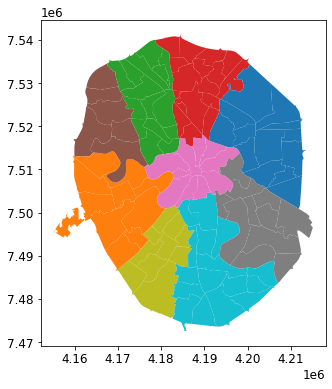

In [39]:
display(districts.head())

districts.plot('name_ao')
plt.show()

Теперь подготовим данные для визуализации по районам. 

Наверно в разрезе по районам интересно будет посмотреть:
- доли разных типов заведений
- для фастфуда и кафе доли сетевых заведений
- любопытно рассчитать условную "плотность" общепита – тупо возьмём количество посадочных мест и количество заведений в районе и поделим на площадь (для районов с огромными парками вроде Лосиного острова или Битцы стоило бы вычесть их из плошади, или вообще смотреть только площадь застройки, но для простоты будем считать общую площадь)
- просили показать районы, где на улице есть только одно заведение. и районы, в которых больше всего заведений на улицах.

In [40]:
# добавим данные по доле разных организаций
type_share = (mos_df
              .pivot_table(index='city_district',
                           columns='type',
                           values='name',
                           aggfunc='count')
              .apply(lambda row: row/row.sum(), axis=1)
              .sort_values(by='фастфуд', ascending=False)
              .reset_index()
              .rename({'бар': 'bar_share',
                       'кафе': 'cafe_share' ,
                       'ресторан': 'rest_share',
                       'столовая': 'canteen_share',
                       'фастфуд': 'junk_share'},  axis=1)
              )

districts = districts.merge(type_share, how='left', left_on='name', right_on='city_district')

In [41]:
# добавим данные по доле сетевых организаций у кафе и фастфуда

chain_share = (mos_df
              .pivot_table(index='city_district',
                           columns=['is_chain', 'type'],
                           values='name',
                           aggfunc='count')
              )

chain_share = (chain_share[True] / 
               (chain_share[True] + chain_share[False])
              )[['кафе', 'фастфуд']]

chain_share.rename({'кафе': 'cafe_chain_share',
                    'фастфуд': 'junk_chain_share'},  axis=1, inplace=True)

districts = districts.merge(chain_share, how='left', left_on='name', right_on='city_district')

In [42]:
# добавим посчитанную площадь районов
districts['area'] = districts.to_crs('EPSG:3035').area

In [43]:
# для каждого района добавим сумму посадочных мест и количество организаций
district_totals = (mos_df
                   .pivot_table(index='city_district',
                                aggfunc={'name': 'count',
                                         'size': 'sum'})
                   .rename({'name': 'count'}, axis=1)
                   )
districts = districts.merge(district_totals, how='left', left_on='name', right_index=True)

In [44]:
# добавим условную плотность общепита на 1 кв. км
districts['cnt_per_sq_km'] = (districts['count'] / districts['area']) * 1_000_000
districts['size_per_sq_km'] = (districts['size'] / districts['area']) * 1_000_000

In [45]:
# посчитаем количество заведений на одной улице
street_count = (mos_df
                .street_with_type
                .fillna('--')
                .value_counts()
                .reset_index()
                .rename({'index': 'street', 'street_with_type':'count'}, axis=1)
               )

# топ-10 улиц, и улицы с одним заведением
top_10 = street_count.head(10).street
one_point_streets = street_count[street_count['count']==1].street

# список районов для топа и дна
top_10_districts = mos_df.query('street_with_type in @top_10').city_district.unique()
one_point_districts = mos_df.query('street_with_type in @one_point_streets').city_district.unique()

Данные готовые – визуализировать их будем чуть позже.

### Сетка

Сделаем ещё сетку с шагом в 1 километр – чтобы можно было сделать тепловую карту. И посчитаем для неё данные.

In [46]:
# возьмём границы наших данных в проекции, которая более точно передает расстояния
west, south, east, north = bbox = mos_df.to_crs('EPSG:3035').total_bounds
west -= 100
east += 100

# шаг сетки – 1000 метров
step = 1000
start = np.array([[west, south],
                  [west, south + step],
                  [west + step, south + step],
                  [west + step, south]])
column = np.array([[step, 0], [step, 0], [step, 0], [step, 0]])
row = np.array([[0, step], [0, step], [0, step], [0, step]])

grid = []

# сгенерим сетку
while start[0][1] < north:
    while start[0][0] < east:
        grid.append(start)
        start = start + column
    start = start + row
    start[0][0], start[1][0] = west, west
    start[2][0], start[3][0] = west+step, west+step

# превратим её в геофрейм
grid = pd.DataFrame(data=[Polygon(i) for i in grid], columns=['geometry'])
grid = gpd.GeoDataFrame(grid)
grid = grid.set_crs('EPSG: 3035').to_crs(epsg=3857)

# добавим квадратам айдишники
grid['id'] = grid.index

In [47]:
# добавим каждой нашей точке id квадрата, в который она попадает

def get_square_id(point):
    try:
        return int(grid.loc[grid.geometry.contains(point), 'id'].values[0])
    except:
        return np.nan

mos_df['square_id'] = mos_df.geometry.apply(get_square_id)

In [48]:
# посчитаем для каждой ячейки 
# количество заведений разного типа
# и медианный размер заведений этого типа

type_count = (mos_df
              .pivot_table(index='square_id',
                           columns='type',
                           aggfunc={'name': 'count', 'size': 'median'})
              .reset_index()
              .droplevel(0, axis=1)
              )

type_count.columns = ['id',
                      'bar_count',
                      'cafe_count',
                      'rest_count',
                      'canteen_count',
                      'fast_count',
                      'bar_size',
                      'cafe_size',
                      'rest_size',
                      'canteen_size',
                      'fast_size']

type_count['total_count'] = (type_count
                             .loc[:, 'bar_count':'fast_count']
                             .sum(axis=1)
                             .replace(0, np.nan)
                            )

type_count.head()

,id,bar_count,cafe_count,rest_count,canteen_count,fast_count,bar_size,cafe_size,rest_size,canteen_size,fast_size,total_count
0,16,NaN,1.00,NaN,NaN,NaN,NaN,44.00,NaN,NaN,NaN,1.00
1,17,NaN,NaN,NaN,2.00,1.00,NaN,NaN,NaN,103.00,2.00,3.00
2,18,NaN,NaN,1.00,2.00,NaN,NaN,NaN,114.00,103.00,NaN,3.00
3,19,NaN,1.00,NaN,2.00,1.00,NaN,55.00,NaN,103.00,31.00,4.00
4,21,NaN,NaN,1.00,NaN,NaN,NaN,NaN,50.00,NaN,NaN,1.00


In [49]:
grid = grid.merge(type_count, how='left', on='id')

In [50]:
grid.head()

,geometry,id,bar_count,cafe_count,rest_count,canteen_count,fast_count,bar_size,cafe_size,rest_size,canteen_size,fast_size,total_count
0,"POLYGON ((4147204.227 7489717.390, 4147878.654...",0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"POLYGON ((4148858.776 7489058.081, 4149533.479...",1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"POLYGON ((4150513.070 7488398.489, 4151188.048...",2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"POLYGON ((4152167.108 7487738.614, 4152842.362...",3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"POLYGON ((4153820.891 7487078.457, 4154496.420...",4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Кажется, все данные подготовлены. Можем перейти к визуализации, анализу и подготовке картинок для презентации.

In [51]:
# скачаем ещё картографическую подложку для наших карт, чтобы не грузить её каждый раз из интернета

west, south, east, north = bbox = grid.total_bounds
img, ext = ctx.bounds2raster(west,
                             south,
                             east,
                             north,
                             "toner.tif",
                             source=ctx.providers.Stamen.Toner,
                            )

## Визуализация и анализ

### Типы заведений

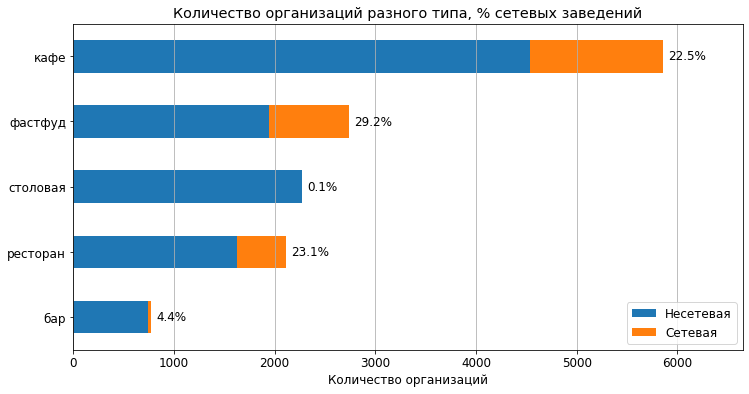

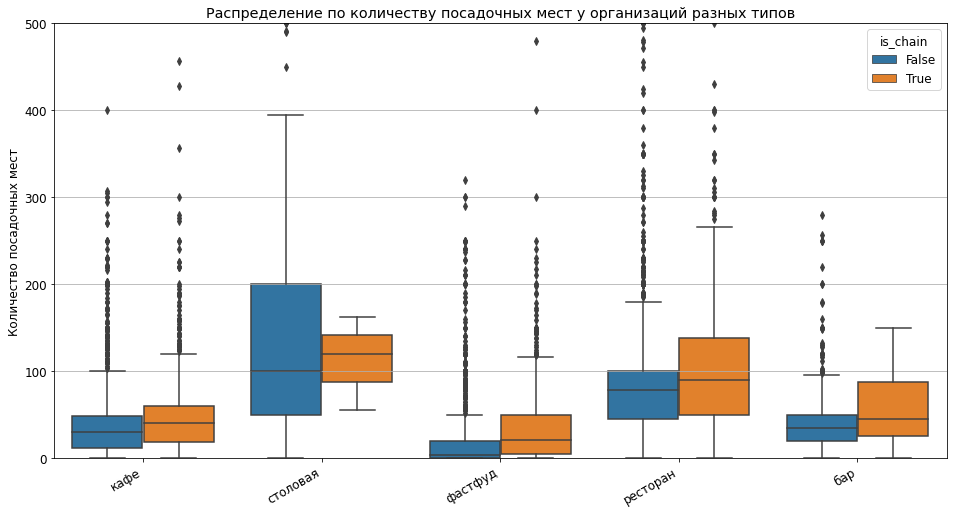

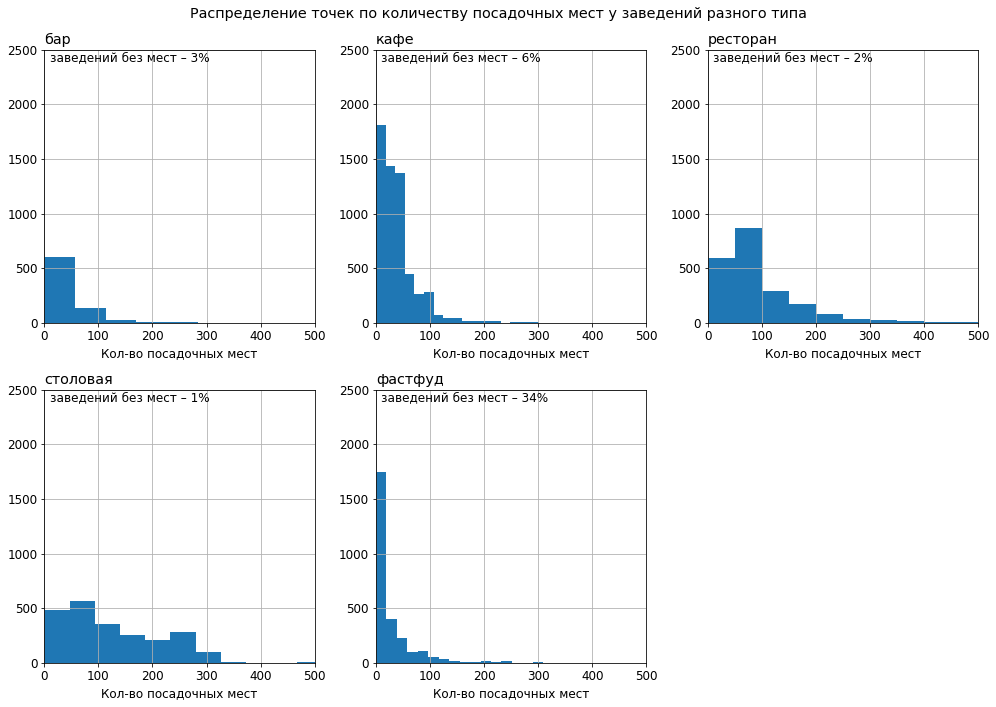

In [52]:
# сначала построим наши основные графики по типам организаций

show_type_plot(mos_df)
show_type_box(mos_df)
show_type_size_hist(mos_df)

Выводы здесь примерно те же, что и выше:
- Самый распространенный тип общепита по количеству заведений – кафе. Меньше всего – баров.
- Самые большие по количеству мест – столовые и рестораны. На втором месте кафе и бары.
- Самые маленькие – заведения фастфуда. Причём сетевой фастфуд заметно крупнее одиночных заведений. Видимо, из-за того, что у одиночного фастфуда высокая доля заведений вообще без посадочных мест.
- Сетевой формат актуален только для кафе, фастфуда и ресторанов (у последних, вероятно, это эффект того, что часть фастфуда записано в наших данных как рестораны). 

### Сети

Посмотрим, отличаются ли чем-то сетевые заведения от одиночных.

/opt/conda/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


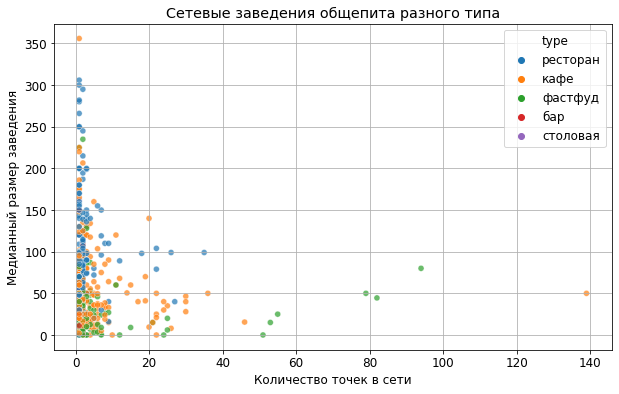

,norm_name,type,units_count,median_unit_size
655,шоколадница,кафе,139,50.00
376,макдоналдс,фастфуд,94,80.00
132,бургер кинг,фастфуд,82,44.50
32,kfc,фастфуд,79,50.00
604,теремок,фастфуд,55,25.00
352,крошка картошка,фастфуд,53,15.00
389,милти,фастфуд,51,0.00
198,домино с пицца,кафе,46,15.50
332,кофе хаус,кафе,36,50.00
644,чайхона 1,ресторан,35,99.00


In [53]:
# посмотрим на графике, на количество и размер заведений в сети
# и выведем топ-10 сетей по количеству точек

chains = (mos_df
          .query('is_chain')
          .pivot_table(index=('norm_name', 'type'), aggfunc={'size': 'median', 'name': 'count'})
          .reset_index()
#           .query('name > 1')
         )

fig, ax = plt.subplots(figsize=(10, 6))
sns.scatterplot(chains['name'], chains['size'], hue=chains['type'], alpha=0.7)
ax.set_xlabel('Количество точек в сети')
ax.set_ylabel('Медианный размер заведения')
ax.set_title('Сетевые заведения общепита разного типа')
ax.grid()
plt.show()

(chains
 .sort_values(by='name', ascending=False)
 .rename({'name': 'units_count', 'size': 'median_unit_size'}, axis=1)
 .head(10))

- В целом видим, что в большинстве сетей не больше 50 точек (от части это может объясняться проблемами с нашими данными). Много очень маленьких сетей – из 1-5 точек. 
- В целом чем больше точек в сети – тем меньше медианный размер заведений.
- У фастфуда – размер заведений меньше, чем у кафе. Самые большие – рестораны.

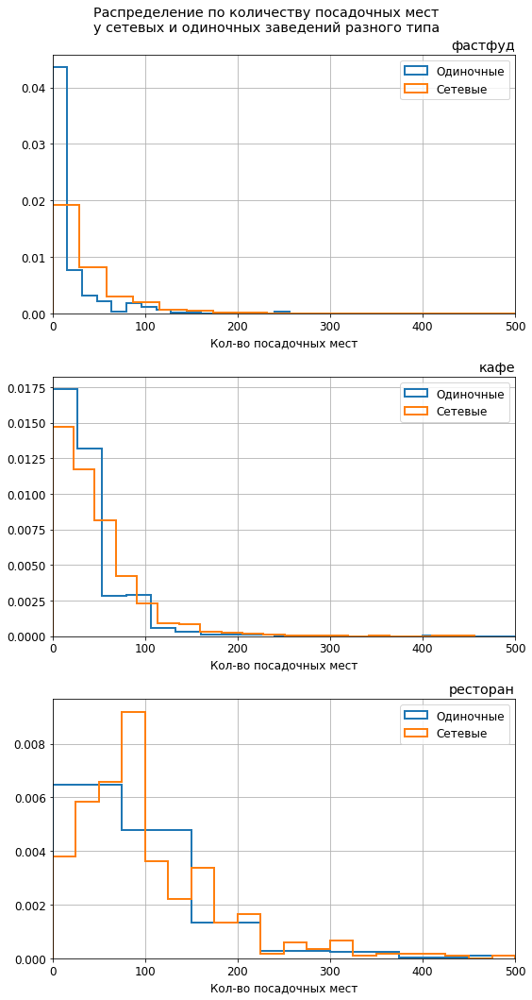

In [54]:
# сравним размер сетевых и одиночных заведений разного типа
# чтобы нивелировать различие в абсолютном числе будем строить гистограммы плотности

types = ['фастфуд', 'кафе', 'ресторан']

fig, axes = plt.subplots(3, 1, figsize=(8, 15))
for param, ax in zip(types, axes.flat):
    (mos_df
     .query('type == @param')
     .groupby('is_chain')['size']
     .hist(histtype='step',
           density=True,
           ax=ax,
           bins=20,
          linewidth=2)
    )
    ax.legend(['Одиночные', 'Сетевые'])
    ax.set_title(param, loc='right')
    ax.set_xlim(0, 500)
    ax.set_xlabel('Кол-во посадочных мест')

plt.suptitle('''Распределение по количеству посадочных мест
у сетевых и одиночных заведений разного типа''')
plt.tight_layout()
plt.show()   

У фастфуда и кафе – сетевые заведения обычно больше одиночных. У ресторанов – скорее наоборот – сетевые рестораны тяготеют к какому-то среднему размеру – а среди одиночных много маленьких, но  есть и достаточное количество больших. 

### Территориальное распределение

Посмотрим, как заведения разного типа распределяются по территории города.

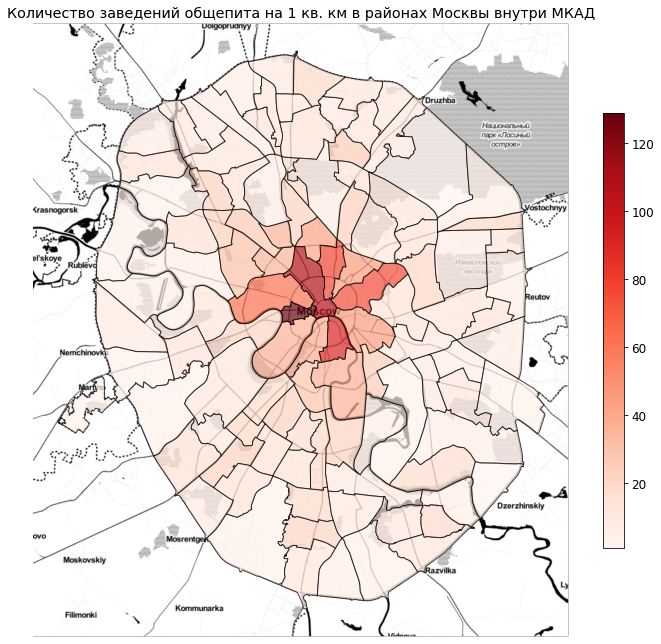

In [55]:
# нарисуем карту по районам

def show_district_map(param, title):
    fig, ax = plt.subplots(figsize=(12, 16))
    (districts
     .plot(param,
           cmap='Reds',
           alpha=0.7,
           ax=ax,
           edgecolor='black',
           legend=True,
           legend_kwds={'shrink': 0.5})
    )
    ax.set_title(title)
    ax.set_axis_off()

#     ctx.add_basemap(ax, crs=districts.crs, source=ctx.providers.CartoDB.Voyager)
    ctx.add_basemap(ax, crs=districts.crs, source='toner.tif')
    plt.show()
    
show_district_map('cnt_per_sq_km', 'Количество заведений общепита на 1 кв. км в районах Москвы внутри МКАД')

In [56]:
# топ-5 районов города по количеству заведений на 1 кв. км
districts.sort_values(by='cnt_per_sq_km', ascending=False)[['name', 'cnt_per_sq_km']].head(5)

,name,cnt_per_sq_km
47,арбат,129.08
50,тверской,106.83
64,замоскворечье,91.54
62,мещанский,77.67
69,басманный,75.44


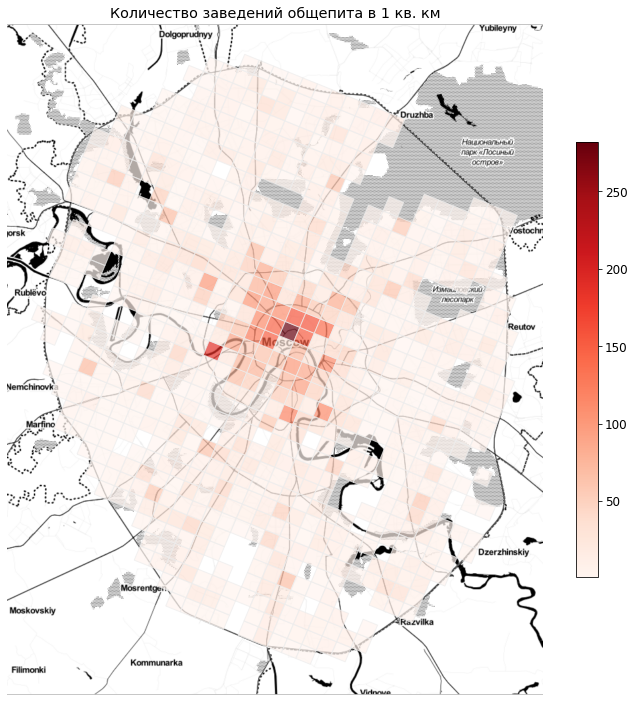

In [57]:
def show_grid_map(param, title):
    fig, ax = plt.subplots(figsize=(12, 16))
    (grid
     .plot(param,
           ax=ax,
           alpha=0.7,
           cmap='Reds',
           edgecolor='#ededed',
           legend=True,
           legend_kwds={'shrink': 0.5})
    )

    ax.set_title(title)
    ax.set_axis_off()

#     ctx.add_basemap(ax, crs=grid.crs, source=ctx.providers.CartoDB.Voyager)
#     ctx.add_basemap(ax, crs=grid.crs, source=ctx.providers.Stamen.Toner)
    ctx.add_basemap(ax, crs=grid.crs, source="toner.tif")
    
    plt.show()
    
show_grid_map('total_count', 'Количество заведений общепита в 1 кв. км')

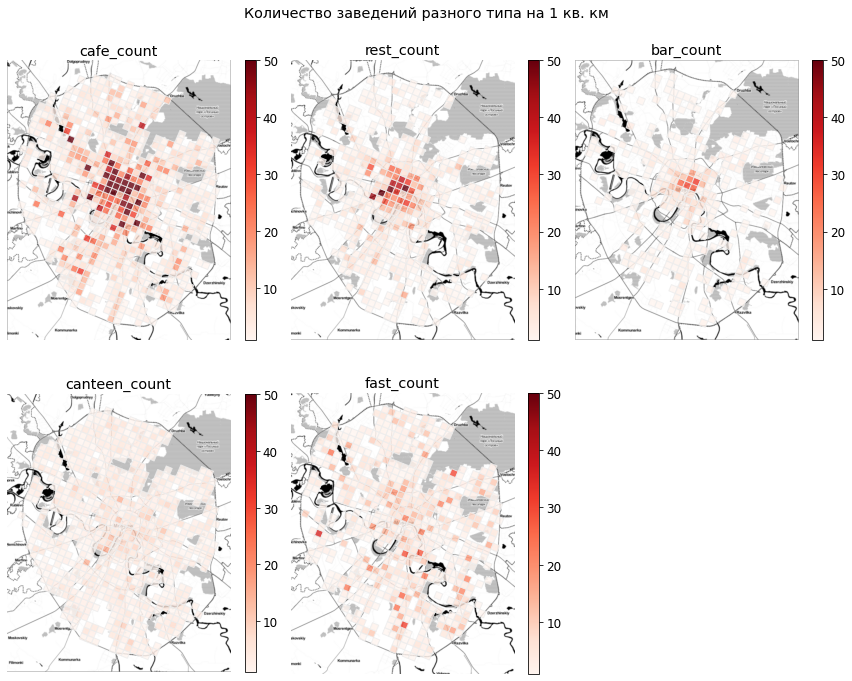

In [58]:
# и построим тепловые карты заведений разных типов
params = ['cafe_count', 'rest_count', 'bar_count', 'canteen_count', 'fast_count']
fig, axes = plt.subplots(2, 3, figsize=(12, 10))

for param, ax in zip(params, axes.flat):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    
    (grid
     .plot(param,
           ax=ax,
           cax=cax,
           alpha=0.8,
           cmap='Reds',
           edgecolor='#ededed',
           legend=True,
           vmax=50
          )
    )
    ctx.add_basemap(ax, crs=grid.crs, source="toner.tif")
    ax.set_title(param)
    ax.set_axis_off()

fig.delaxes(axes.flat[-1])
plt.suptitle('Количество заведений разного типа на 1 кв. км')
plt.tight_layout()
plt.show()

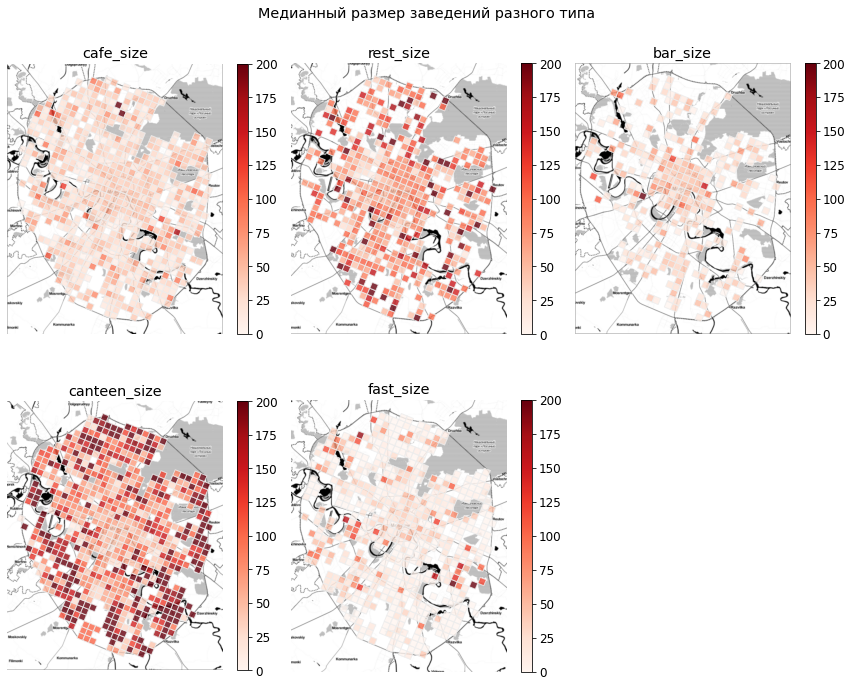

In [59]:
# построим тепловые карты размера заведений разных типов
params = ['cafe_size', 'rest_size', 'bar_size', 'canteen_size', 'fast_size']
fig, axes = plt.subplots(2, 3, figsize=(12, 10))

for param, ax in zip(params, axes.flat):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    
    (grid
     .plot(param,
           ax=ax,
           cax=cax,
           alpha=0.8,
           cmap='Reds',
           edgecolor='#ededed',
           legend=True,
           vmax=200
          )
    )
    ctx.add_basemap(ax, crs=grid.crs, source="toner.tif")
    ax.set_title(param)
    ax.set_axis_off()

fig.delaxes(axes.flat[-1])
plt.suptitle('Медианный размер заведений разного типа')
plt.tight_layout()
plt.show()

Несложно заметить, что в центре города (в пределах ТТК и Садового) плотность заведений общепита заметно выше, чем на окраинах. Однако разные типы заведений распределены по-разному. Сильнее всего к центру города тяготеют рестораны и бары. Кафе в центре больше, чем на окраинах, но и в спальных районах их тоже достаточно. Столовые и фастфуд распределены по городу более-менее равномерно.

Размер заведений, наоборот, растёт по мере удаления от центра. Вероятно, это объясняется тем, что на окраинах общепит концентрируется в местах притяжения: рядом со станциями метро, торгово-развлекательными и бизнес-центрами – и в этих местах открываются сравнительно большие, чем в центре точки. А также тем, что на окраинах в принципе доступны площади большего, чем в центре, размера.

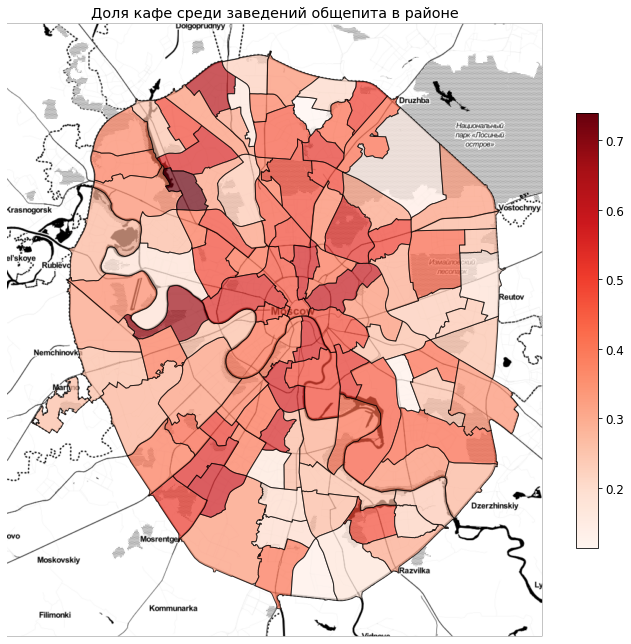

In [60]:
# посмотрим на долю кафе
show_district_map('cafe_share', 'Доля кафе среди заведений общепита в районе')

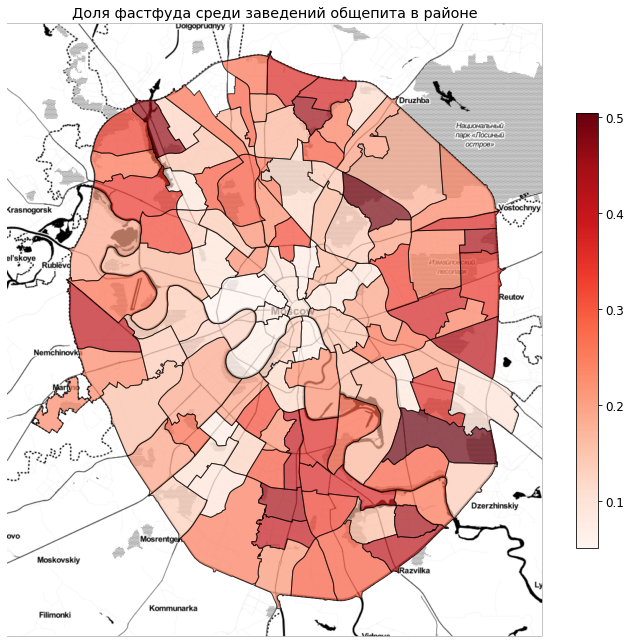

In [61]:
# и на долю фастфуда
show_district_map('junk_share', 'Доля фастфуда среди заведений общепита в районе')

Структура заведений общепита по типам зависит от района города. Если очень грубо, то в центре, на юго-западе и на севере – основной тип (по количеству заведений) – это кафе. А на юге и востоке и в целом в окраинных районах – общепит представлен в первую очередь заведениями фастфуда. 

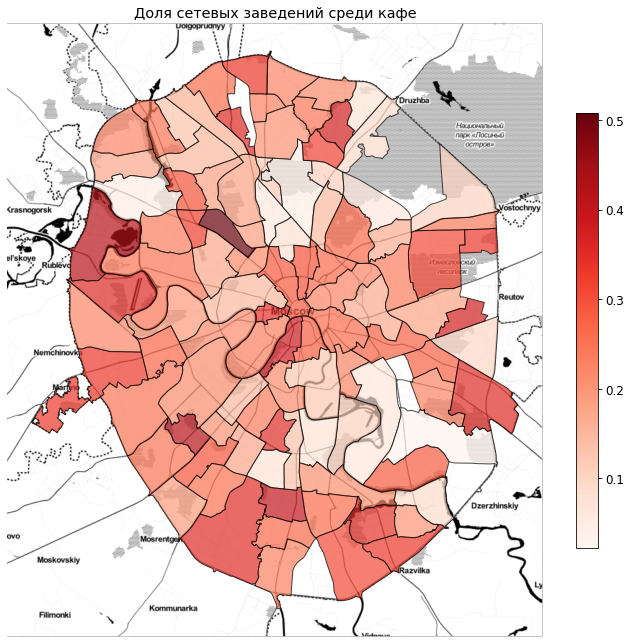

In [62]:
# посмотрим на долю сетей среди кафе по районам
show_district_map('cafe_chain_share', 'Доля сетевых заведений среди кафе')

Наверно можно сказать, что доля сетевых кафе выше на окраинах города – вероятно, это объясняется тем, что доля сетевых кафе выше там, где количество заведений в целом меньше.

### Улицы: где больше всего и где меньше всего заведений

Нас попросили выяснить, на каких улицах города находится больше всего и меньше всего заведений. Кажется, задача не очень осмысленная – так как наверх скорее всего попадут просто длинные проспекты. А внизу вперемешку окажутся коротенькие переулочки с одной кафешкой в центре или глухие улицы на окраинах. Но давайте сделаем.

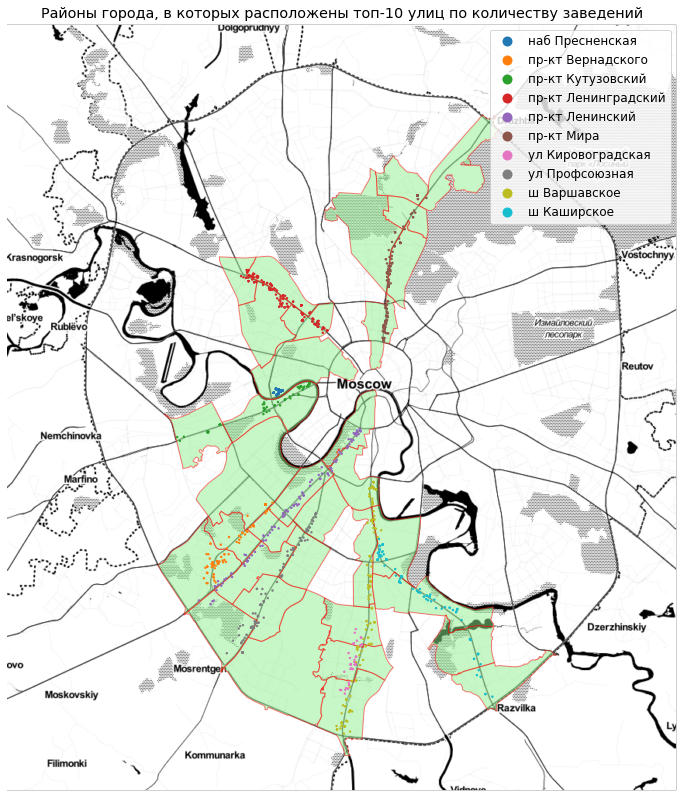

In [63]:
# карта улиц и районов
fig, ax = plt.subplots(figsize=(12, 16))

# отрисовываем районы
(districts
 .query('name in @top_10_districts')
 .plot(ax=ax, color='lightgreen', edgecolor='red', alpha=0.5))

# и все районы невидимым слоем, чтобы не выставлять руками нужную область карты
districts.plot(ax=ax, zorder=0)

# и точки
mos_df.query('street_with_type in @top_10').plot('street_with_type', ax=ax, markersize=2, legend=True)
ctx.add_basemap(ax, crs=districts.crs, source='toner.tif')

ax.set_title('Районы города, в которых расположены топ-10 улиц по количеству заведений')
ax.set_axis_off()

plt.show()

In [64]:
# список топовых улиц
list(top_10)

['пр-кт Мира',
 'ул Профсоюзная',
 'пр-кт Ленинградский',
 'наб Пресненская',
 'ш Варшавское',
 'пр-кт Ленинский',
 'пр-кт Вернадского',
 'пр-кт Кутузовский',
 'ш Каширское',
 'ул Кировоградская']

In [65]:
# список районов, в которые попали заведения с топовых улиц
list(top_10_districts)

['донской',
 'нагорный',
 'чертаново южное',
 'гагаринский',
 'ломоносовский',
 'проспект вернадского',
 'тропарево-никулино',
 'фили-давыдково',
 'нагатино-садовники',
 'москворечье-сабурово',
 'чертаново центральное',
 'дорогомилово',
 'беговой',
 'аэропорт',
 'сокол',
 'якиманка',
 'обручевский',
 'мещанский',
 'останкинский',
 'алексеевский',
 'академический',
 'черемушки',
 'коньково',
 'теплый стан',
 'орехово-борисово южное',
 'чертаново северное',
 'хорошевский',
 'орехово-борисово северное',
 'ростокино',
 'свиблово',
 'ясенево',
 'раменки',
 'пресненский',
 'ярославский']

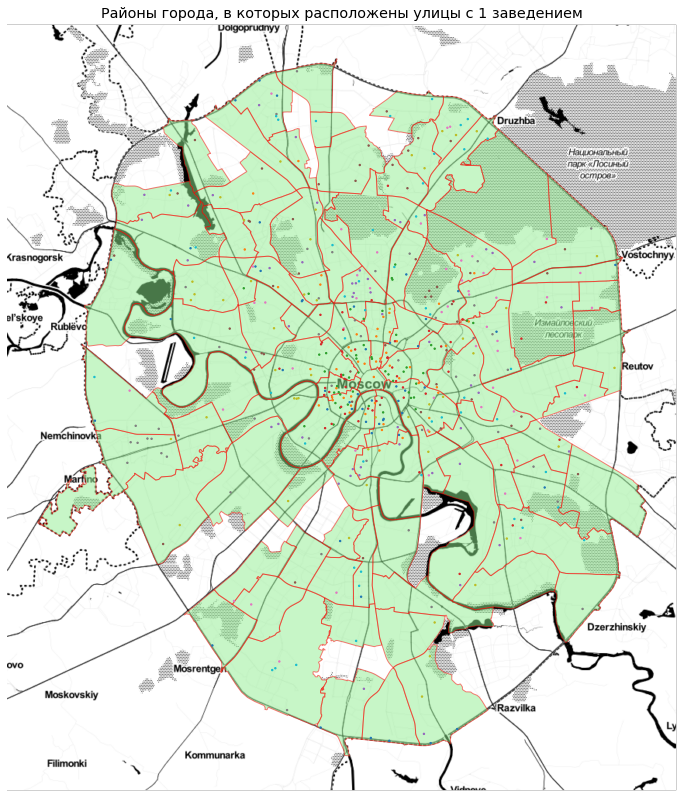

In [66]:
# карта районов и улиц с 1 заведением 
fig, ax = plt.subplots(figsize=(12, 16))
(districts
 .query('name in @one_point_districts')
 .plot(ax=ax, color='lightgreen', edgecolor='red', alpha=0.5)
)

(mos_df
 .query('street_with_type in @one_point_streets')
 .plot('street_with_type', ax=ax, markersize=2)
)

ax.set_title('Районы города, в которых расположены улицы с 1 заведением')
ax.set_axis_off()

ctx.add_basemap(ax, crs=districts.crs, source='toner.tif')
plt.show()

In [67]:
one_point_streets

1194                  пер Гжельский
1195      пер Большой Строченовский
1196             пер 7-й Ростовский
1197                  ул Прохладная
1198        ул Академика Арцимовича
1199              туп Кондрашевский
1200               пер Ботанический
1201                 ул Гродненская
1202                      ул Лапина
1203                   ул Хованская
1204                   ул Немчинова
1205                  ул Кунцевская
1206                     ул Капотня
1207          проезд Канатчиковский
1208                    пер Живарев
                   ...             
1666    проезд Проектируемый 1980-й
1667               проезд Олонецкий
1668             ул 4-я Гражданская
1669                  ул Платовская
1670                   ул Зюзинская
1671                   ул Печорская
1672             ул 2-я Гражданская
1673                   км МКАД 34-й
1674                проезд Тенистый
1675                 пер Скорняжный
1676                ул Айвазовского
1677               пер Филип

Как и ожидали – в топе самые длинные улицы города. Улиц с 1 заведением – почти 500 штук, и они есть почти во всех районах города.

## Общий вывод и рекомендации


- **Ещё раз постановка задачи**:
   - Мы решили открыть "небольшое кафе". "Гостей в нём должны обслуживать роботы".
   - Сможет ли оно снискать популярность на долгое время?
   - Какой должен быть вид заведения, количество посадочных мест, район расположения?
   - Есть ли возможность развития сети?

### Выводы

- **Комментарий о качестве данных**:
    - Данные плохо подходят для ответа на поставленные вопросы.
    - Неизвестны источник данных, способ их сбора, точность и полнота.
    - Качество данных низкое: есть явные ошибки, нет описания значений, одноименные заведения попадают в разные типы и форматы заведений и т.д.


- **Выводы о рынке общепита**
    - В Москве в пределах МКАД (по имеющимся данным) почти 14 тыс. заведений общепита. Больше всего - 5,9 тыс. кафе.
    - По количеству посадочных мест кафе на втором месте: самые маленькие – заведения фастфуда (треть вообще не имеет посадочных мест) медианный размер - 8 мест, кафе – 30, бар – 36, ресторан – 80 и столовые – 100.
    - У ресторанов и кафе – около 23% всех заведений относятся к сетям. У фастфуда таких заведений почти 29%. У баров и столовых сетевых заведений очень мало.
    - Количество точек в сетях - если верить нашим данным – небольшое. Если не учитывать сети, состоящие из одного заведения (таких "сетей" больше половины), то для кафе медианный размер сети – 4 точки.
    - Сетевые кафе обычно больше по размеру, чем одиночные.
    - В центре города плотность заведений общепита заметно выше, чем на окраинах.
    - Сильнее всего к центру города тяготеют рестораны и бары.
    - Кафе в центре больше, чем на окраинах, но и в спальных районах их тоже достаточно.
    - Кафе – это основной тип заведений общепита в центре, на юго-западе и на севере города.
    - Размер заведений растёт по мере удаления от центра.
    - Доля сетевых кафе на окраинах выше, чем в центре.

### Рекомендации

Кажется, что для нормального ответа на поставленные вопросы следовало бы искать и изучать другие данные: например, попытаться оценить туристический трафик - его количество и структуру - в разных местах города, изучить разные варианты экономики кафе, провести экспертные интервью с рестораторами.

В целом несколько сомнительно, что модель небольшого кафе с дорогостоящим аттракционом в виде роботов-официантов вообще жизнеспособна.

Но если фантазировать и пытаться использовать наши данные, то видимо, целевой аудиторией этого кафе должны быть не постоянные гости, а большой поток одноразовых посетителей, туристов, которые к тому же не засиживаются в кафе надолго, а, сделав селфи с роботом и оплатив счёт, быстро освобождают место для следующей партии.

Следовательно, такое заведение должно находиться там где таких туристов и отдыхающих постоянно много – рядом с крупными городскими достопримечательностями, парками отдыха, музеями и т.д. Скорее всего это означает, что заведение должно быть в центре города.

Вероятно, показателем того, что поток людей вообще есть, можно считать большое количество работающих кафе – если есть конкуренция, значит есть за что. Так что выбирать наверно стоит места с большим количеством кафе в округе.

Дальше есть варианты: либо пытаться заходить прямо в топовые места вроде Арбата – пусть это будет топ-5% квадратов по количеству кафе. Либо же, наоборот, из топовых искать места, где нет сверх-конкуренции – возможно, цены на аренду и доступность площадей там будет лучше. Пусть это будут квадраты, которые находятся от 80 до 95 процентиля по количеству кафе.

Посмотрим на карте, что это за места. И каков размер кафе в этих квадратах.

In [68]:
# будем считать, что популярные места длл кафе начинаются с 80-го процентия по количеству кафе
# а сверх-популярные – с 95-го

per_80 = np.percentile(grid.cafe_count.dropna(), 80)
per_95 = np.percentile(grid.cafe_count.dropna(), 95)

# запишем списки квадратов
high_80_95 = grid.query('cafe_count >= @per_80 and cafe_count <= @per_95')['id']
top_95 = grid.query('cafe_count >= @per_95')['id']

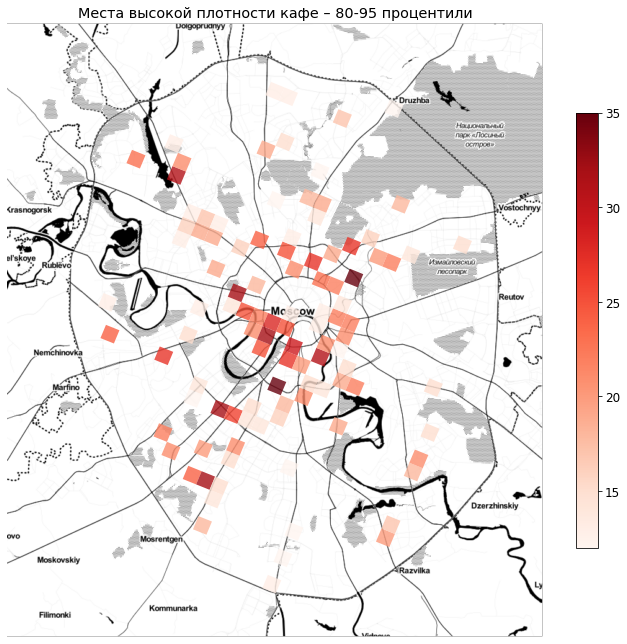

Список районов


array(['таганский', 'арбат', 'отрадное', 'нагатинский затон',
       'нагатино-садовники', 'мещанский', 'академический', 'аэропорт',
       'басманный', 'савеловский', 'люблино', 'дорогомилово', 'щукино',
       'останкинский', 'соколиная гора', 'ломоносовский', 'донской',
       'нагорный', 'чертаново южное', 'даниловский', 'гагаринский',
       'хамовники', 'обручевский', 'сокол', 'марьина роща',
       'северное тушино', 'пресненский', 'якиманка', 'южнопортовый',
       'кузьминки', 'измайлово', 'филевский парк', 'алексеевский',
       'замоскворечье', 'красносельский', 'марфино', 'головинский',
       'беговой', 'войковский', 'раменки', 'коньково', 'кунцево',
       'бибирево', 'восточное измайлово', 'богородское', 'преображенское',
       'тверской', 'котловка', 'ростокино', 'фили-давыдково',
       'левобережный', 'сокольники', 'южное тушино', 'крылатское',
       'ярославский', 'хорошевский', 'марьино', 'тропарево-никулино',
       'орехово-борисово южное', 'теплый стан', 'черем

Размер кафе в этих квадратах


count   2_008.00
mean       36.34
std        35.01
min         0.00
25%        10.00
50%        30.00
75%        48.00
max       305.00
Name: size, dtype: float64

In [69]:
# вот места, в которых плотность кафе находится с 80 по 95 процентиль

fig, ax = plt.subplots(figsize=(12, 16))

districts.plot(ax=ax,alpha=0.0)
(grid
 .query('id in @high_80_95')
 .plot('cafe_count', ax=ax, cmap='Reds', alpha=0.8, legend=True, legend_kwds={'shrink': 0.5})
)
ctx.add_basemap(ax, crs=districts.crs, source='toner.tif')

ax.set_title('Места высокой плотности кафе – 80-95 процентили')
ax.set_axis_off()

plt.show()

print('Список районов')
display(mos_df.query('square_id in @high_80_95').city_district.unique())
print('Размер кафе в этих квадратах')
mos_df.query('square_id in @high_80_95 and type=="кафе"')['size'].describe()

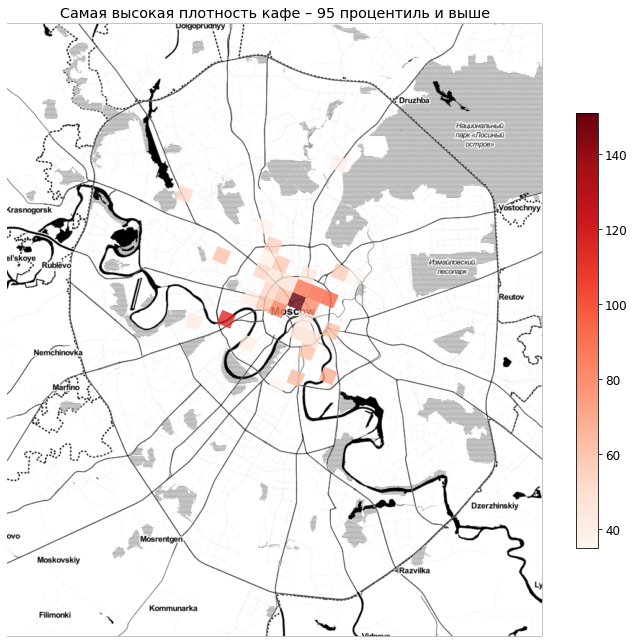

Список районов


array(['арбат', 'мещанский', 'басманный', 'замоскворечье', 'дорогомилово',
       'тверской', 'пресненский', 'савеловский', 'бутырский', 'беговой',
       'таганский', 'красносельский', 'якиманка', 'даниловский',
       'хамовники', 'донской', 'марьина роща', 'хорошевский',
       'филевский парк', 'свиблово', 'войковский', 'академический',
       'ярославский'], dtype=object)

Размер кафе в этих квадратах


count   2_069.00
mean       40.43
std        40.09
min         0.00
25%        12.00
50%        30.00
75%        50.00
max       456.00
Name: size, dtype: float64

In [70]:
# и самая высокая плотность

fig, ax = plt.subplots(figsize=(12, 16))

districts.plot(ax=ax,alpha=0.0)
(grid
 .query('id in @top_95')
 .plot('cafe_count', ax=ax, cmap='Reds', alpha=0.8, legend=True, legend_kwds={'shrink': 0.5})
)
ctx.add_basemap(ax, crs=districts.crs, source='toner.tif')

ax.set_title('Самая высокая плотность кафе – 95 процентиль и выше')
ax.set_axis_off()

plt.show()

print('Список районов')
display(mos_df.query('square_id in @top_95').city_district.unique())
print('Размер кафе в этих квадратах')
mos_df.query('square_id in @top_95 and type=="кафе"')['size'].describe()

Ну что ж – как и предполагали, наивысшая концентрация кафе в пределах Садового кольца в северной части. Если хотим меньше конкуренции и, вероятно, дешевле аренду, но и меньше людей, то у нас тоже есть варианты – в пределах ТТК на юге, за ТТК юго-запад и северо-запад.

Размер кафе в топовых локациях в центре незначительно больше. Медианное значение в обоих случаях 30 посадочных мест.

Ссылка на презентацию: https://disk.yandex.ru/i/hldcMeA-vSME6w